# Skin Atlas: Normal Skin Data Analysis Notebook (Visium + Xenium)

The below script contains code for the analysis of 3 normal visium and xenium skin samples generated for the skin cancer atlas publication. 
* code below is finalised analysis

Author: Andrew Causer (6/1/2025)

## Load Data and Import Packages

#### Load Libraries

In [1]:
library(Seurat)
library(ggplot2)
library(CARD)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Registered S3 methods overwritten by 'registry':
  method               from 
  print.registry_field proxy
  print.registry_entry proxy

Warning message:
“replacing previous import ‘RcppML::nmf’ by ‘NMF::nmf’ when loading ‘CARD’”


#### Set I/O Directories

In [2]:
## Data must be symbolically linked from RDM/Scratch (check out README.md file for more infomation on how to link files)
## or INPUT_DIR can be changed to define the path to data stored elsewhere.

INPUT_DIR <- "../data/raw_data/"
OUPTU_DIR <- "../data/output/"

#### Load Visium data

In [3]:
visium <- readRDS(paste0(INPUT_DIR, "Normal_Visium.RDS"))

In [4]:
visium

An object of class Seurat 
18085 features across 2101 samples within 1 assay 
Active assay: Spatial (18085 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: slice1

#### Load Xenium data

In [5]:
xenium <- readRDS(paste0(INPUT_DIR, "Normal_Xenium.RDS"))

In [6]:
xenium

$sample_1
An object of class Seurat 
541 features across 7422 samples within 4 assays 
Active assay: Xenium (377 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: fov

$sample_2
An object of class Seurat 
541 features across 13354 samples within 4 assays 
Active assay: Xenium (377 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: fov

$sample_3
An object of class Seurat 
541 features across 13404 samples within 4 assays 
Active assay: Xenium (377 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: fov


#### Load scRNA Reference data

In [7]:
scRNA <- readRDS(paste0(INPUT_DIR, "scRNA_reference.RDS"))

In [8]:
scRNA

An object of class Seurat 
23786 features across 45909 samples within 1 assay 
Active assay: RNA (23786 features, 0 variable features)
 1 layer present: counts

In [37]:
## Also load scRNA colour palette

level2_color_dict = list(
    'Endothelial Cell'="#FFA500", 
    "Fibroblast"= "#458B00", 
    "DC" = "#5F9EA0",
    "LC" = "#0000CD",
    "Macrophage" = "#EEEE00",
    "NK"= "#9ACD32",
    "T Cell"= "#1874CD",
    "KC Basal" = "#FF6A6A",
    "KC Cornified" = "#8B3A62",
    "KC Differentiating" = "#ab82ff",
    "KC Hair" = "#FF0000",
    "Melanocytes" = "#8B4513",
   'Plasma' = '#4a3b53',
   'B Cell' = '#ffaa92',
   'KC IFN' = '#7b4f4b', 
   "Treg" = "#00B2EE",
   "Monocytes"="#6a3a4c",
   "KC Dysplastic"= "#dac0eb",
   "Ambiguous"="grey")

## Visium Analysis 

### Running Data Quality Control

First the data must be filtered and normalised

In [9]:
###Run QC
  
# QC - removing Mitochondrial and Ribosomal Genes
message("QC - removing Mitochondrial and Ribosomal Genes...")
visium <- PercentageFeatureSet(visium, "^MT-", col.name = "percent_mito", assay="Spatial")
visium <- PercentageFeatureSet(visium, "^RP[SL]", col.name = "percent_ribo", assay="Spatial")

# filtering cells with < 100 counts
selected_c <- WhichCells(visium, expression = nFeature_Spatial > 50)
message(as.character(length(rownames(visium@meta.data)) - length(selected_c)), " spots were removed")

# filtering genes 
selected_f <- rownames(visium)[Matrix::rowSums(visium[["Spatial"]]["counts"] > 0) >= 3]
message(length(rownames(visium))-length(selected_f), " genes were removed")

# Removing outlying cells
visium <- subset(visium, features = selected_f, cells = selected_c)

QC - removing Mitochondrial and Ribosomal Genes...

6 spots were removed

269 genes were removed

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


Next we will normalise the data

In [10]:
visium <- SCTransform(visium, assay = "Spatial",verbose = F)

#### Run Visium clustering

In [11]:
visium <- RunPCA(visium, assay = "SCT", npcs = 30,verbose = FALSE)
visium <- FindNeighbors(visium, dims = 1:30, verbose = FALSE)
visium <- RunUMAP(visium, dims = 1:30, verbose = FALSE)
visium <- FindClusters(visium, resolution = 0.5, cluster.name = "clusters", verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [12]:
visium

An object of class Seurat 
35285 features across 2095 samples within 2 assays 
Active assay: SCT (17469 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: Spatial
 2 dimensional reductions calculated: pca, umap
 1 spatial field of view present: slice1

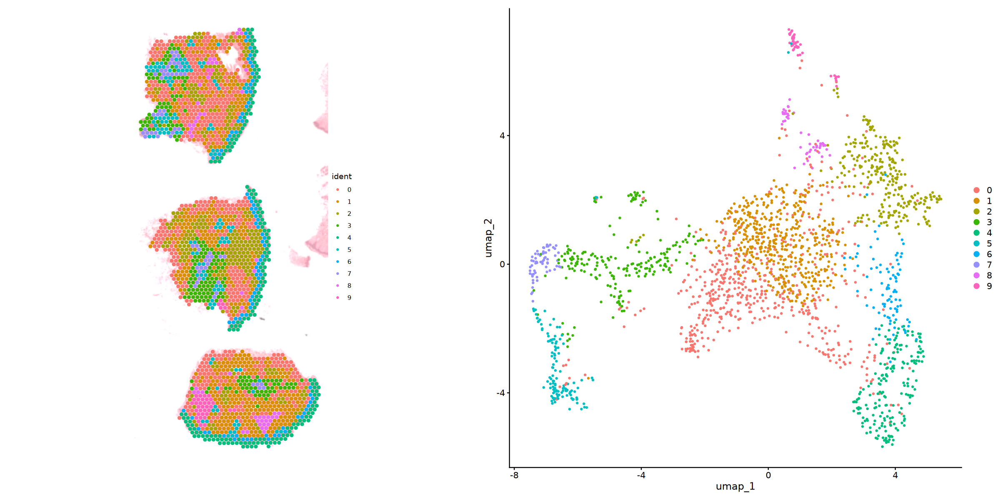

In [13]:
options(repr.plot.width = 20, repr.plot.height = 10)
SpatialDimPlot(visium, pt.size.factor = 5.3, image.alpha = 0.5)&theme_void()|DimPlot(visium)

### Run Visium Cell Typing

In [14]:
#TODO: Check clusters by using marker genes

### Run Visium Deconvolution

Lets run deconvolution using level2 annotations.

In [15]:
query_coords <- GetTissueCoordinates(visium)
query_coords <- query_coords[c("x", "y")]

CARD_obj = createCARDObject(sc_count = scRNA@assays$RNA["counts"],
                            sc_meta = scRNA@meta.data,
                            spatial_count = visium@assays$Spatial["counts"],
                            spatial_location = query_coords,
                            ct.varname = "Level2",
                            ct.select = unique(scRNA@meta.data$Level2),
                            sample.varname = "sample",
                            minCountGene = 50,
                            minCountSpot = 3) 

CARD_obj = CARD_deconvolution(CARD_object = CARD_obj)

## QC on scRNASeq dataset! ...
## QC on spatially-resolved dataset! ...
## create reference matrix from scRNASeq...


Loading required package: nnls

Loading required package: TOAST

Loading required package: EpiDISH

Loading required package: limma


Attaching package: ‘limma’


The following object is masked from ‘package:BiocGenerics’:

    plotMA


Loading required package: quadprog

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

MuSiC v1.0.0 support SingleCellExperiment! See Tutorial: https://xuranw.github.io/MuSiC/articles/MuSiC.html

MuSiC2 for multi-condition bulk RNA-seq data is also available!

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 8.1 GiB”


## Select Informative Genes! ...


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.0 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.0 GiB”


## Deconvolution Starts! ...
## Deconvolution Finish! ...


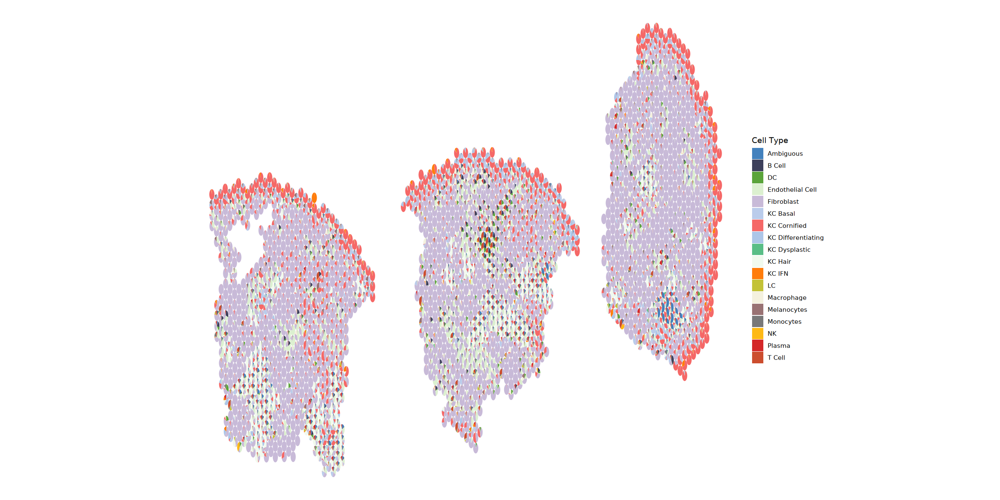

In [16]:
p1 <- CARD.visualize.pie(
	proportion = CARD_obj@Proportion_CARD,
	spatial_location = CARD_obj@spatial_location, 
  	radius = 100)
p1&theme_void()

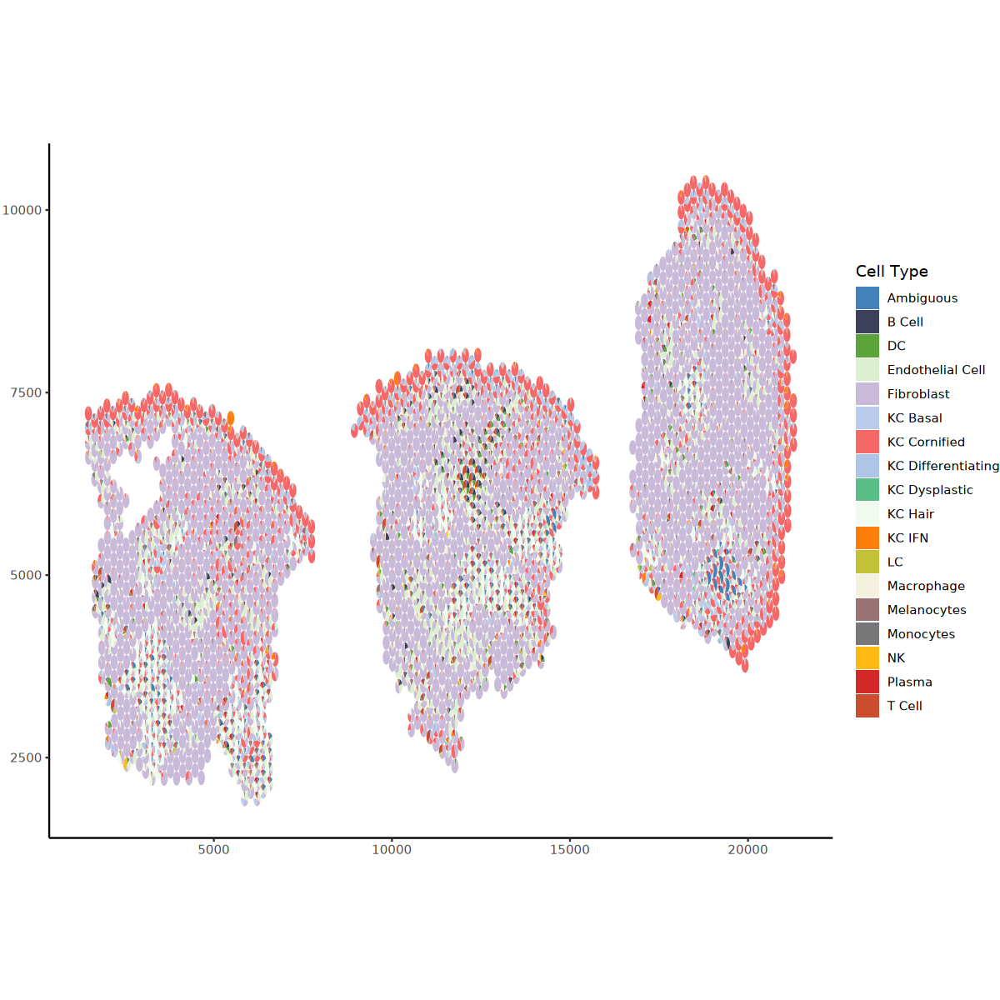

In [115]:
options(repr.plot.width = 25, repr.plot.height = 10)
p1&theme_classic()

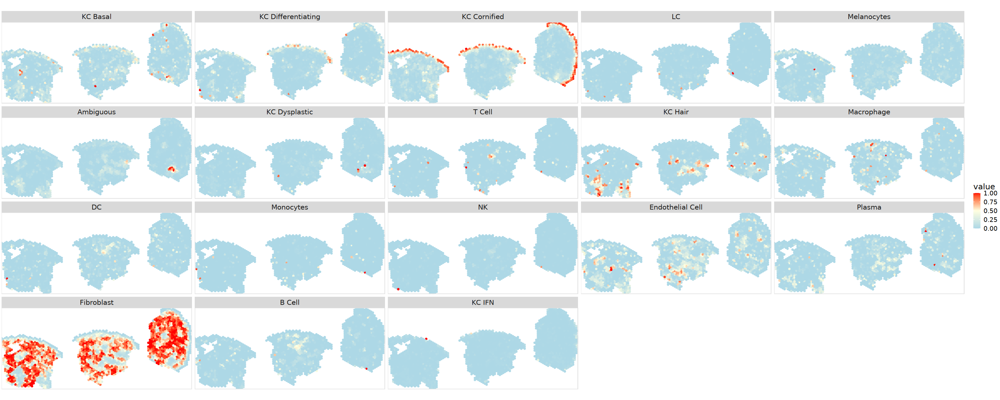

In [17]:
options(repr.plot.width = 25, repr.plot.height = 10)
p2 <- CARD.visualize.prop(
	proportion = CARD_obj@Proportion_CARD,
	spatial_location = CARD_obj@spatial_location, 
	ct.visualize = unique(scRNA$Level2),                 ### selected cell types to visualize
	colors = c("lightblue","lightyellow","red"), ### if not provide, we will use the default colors
	NumCols = NULL,                                 ### number of columns in the figure panel
        pointSize = 1)
p2

In [18]:
df <- data.frame(CARD_obj@Proportion_CARD)

df$Max_Column <- apply(df, 1, function(row) {
  names(df)[which.max(row)]
})

In [55]:
visium@meta.data$deconvolution_max <- df$Max_Column

In [60]:
visium@meta.data$deconvolution_max <- gsub(pattern = "\\.", replacement = " ", x = visium@meta.data$deconvolution_max)

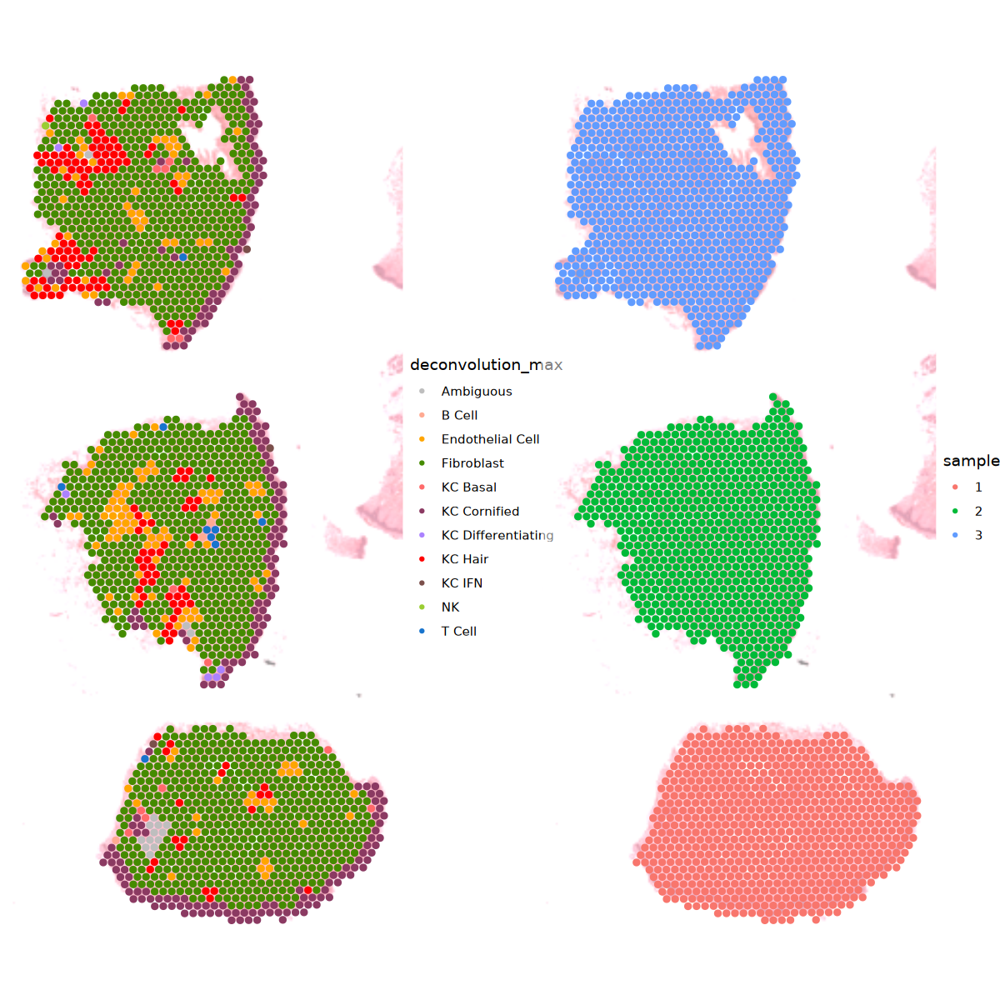

In [111]:
options(repr.plot.width = 10, repr.plot.height = 10)
SpatialDimPlot(visium, group.by = "deconvolution_max", pt.size.factor = 5.3, image.alpha = 0.5, cols = level2_color_dict) &theme_void()| SpatialDimPlot(visium, group.by = "sample", pt.size.factor = 5.3, image.alpha = 0.5)&theme_void()

In [75]:
options(repr.plot.width = 10, repr.plot.height = 20)
p <- SpatialDimPlot(visium, group.by = "deconvolution_max", pt.size.factor = 5.3, image.alpha = 0.7, cols = level2_color_dict) &theme_void()

ggsave(p, filename = paste0(OUPTU_DIR, "normal_visium_celltypes.pdf"), height = 20, width = 10)

## Xenium Analysis

### Normalise Xenium Data and Cluster

In [21]:
for (sample in names(xenium)){
    xenium[[sample]] <- NormalizeData(xenium[[sample]], verbose = F)
    xenium[[sample]] <- ScaleData(xenium[[sample]], verbose = F)
    xenium[[sample]] <- FindVariableFeatures(xenium[[sample]], verbose = F)
    xenium[[sample]] <- RunPCA(xenium[[sample]], npcs = 20, verbose = F)
    xenium[[sample]] <- FindNeighbors(xenium[[sample]], dims = 1:20, verbose = F)
    xenium[[sample]] <- RunUMAP(xenium[[sample]], dims = 1:20, verbose = F)
    xenium[[sample]] <- FindClusters(xenium[[sample]], resolution = 0.3, verbose = F)
}

In [22]:
plots <- list()
for (sample in names(xenium)){
    plots[[sample]] <- ImageDimPlot(xenium[[sample]], size = 2, dark.background = F) + ggtitle(sample)
}

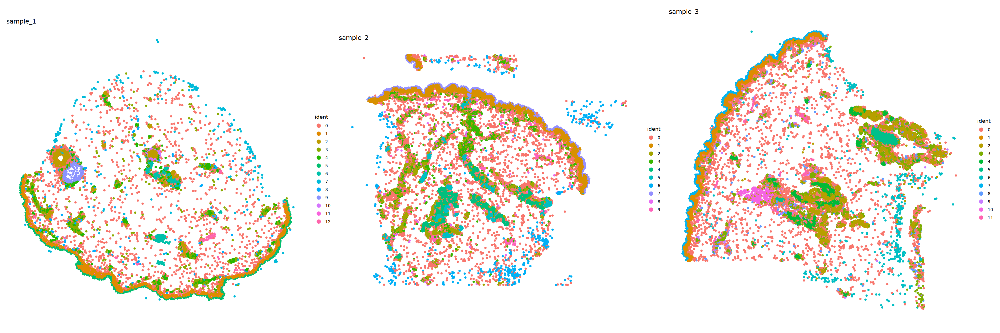

In [23]:
options(repr.plot.width = 30, repr.plot.height = 10)
Reduce("|", plots)

### Merge Xenium Samples

In [24]:
merged_xenium <- merge(xenium[[1]], xenium[2:3])

Warning message:
“Key ‘Xenium_’ taken, using ‘fov2_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘fov3_’ instead”


In [25]:
merged_xenium <- JoinLayers(merged_xenium, assay = "Xenium", layers = c("counts", "data", "scale.data"))

In [26]:
merged_xenium <- FindVariableFeatures(merged_xenium, verbose = F)
merged_xenium <- RunPCA(merged_xenium, npcs = 20, verbose = F)
merged_xenium <- FindNeighbors(merged_xenium, dims = 1:20, verbose = F)
merged_xenium <- RunUMAP(merged_xenium, dims = 1:20, verbose = F)
merged_xenium <- FindClusters(merged_xenium, resolution = 0.3, verbose = F)

In [41]:
names(merged_xenium@images) <- names(xenium)

plots <- list()
for (sample in names(merged_xenium@images)){
    plots[[sample]] <- ImageDimPlot(merged_xenium, fov = sample, size = 2, dark.background = F) + ggtitle(sample)
}

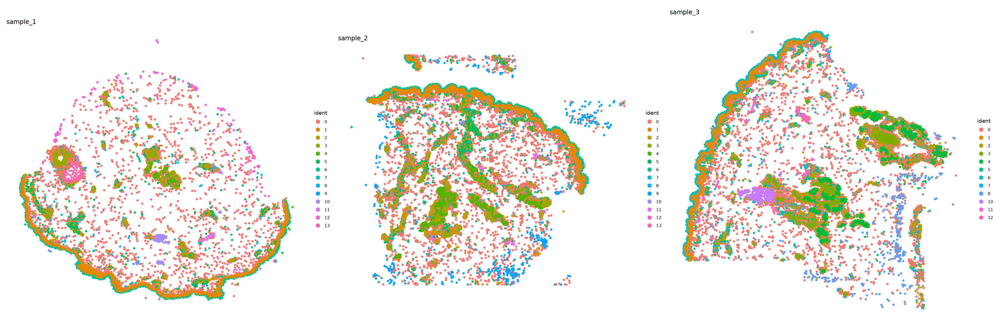

In [42]:
options(repr.plot.width = 30, repr.plot.height = 10)
Reduce("|", plots)

### Run Label Transfer for cell Types

In [30]:
scRNA <- NormalizeData(scRNA, verbose = F)

In [31]:
###' Performs label transfer from the reference dataset for each cell in the Xenium Seurat object
###' 
###' -----------------------------------------------------------------------------
###' Inputs:
###'        @param(Seurat):      Ref_data -> A Reference scRNA Seurat Object used for Label Transfer
###'        @param(Seurat):      Query_data -> A Seurat Xenium Object
###'        @param(character):   ID -> A string defining the sample name
###'        @param(character):   output_dir -> A string defining the directory path for the label transfer .csv file to be stored 
###'
###' Assumption:
###'        1:30 pcs are used to run Anchor Transfer  
###'
###' Returns:
###'        @returns(Seurat):     An updated Xenium Seurat object which contains the label transfer results for each cell in the @meta.data slot 
###'

run_label_transfer <- function(Ref_data, Query_data, ID) {
    
    common_genes <- intersect(rownames(Ref_data), ### Uses only genes which are shared between the reference and xenium datasets
                        rownames(Query_data))

    print(paste0("Using ",length(common_genes), " common genes (shared between reference and the ",ID, " query datasets) to perform Label Transfer"))
        
    anchors <- FindTransferAnchors(reference = Ref_data, 
                                 query = Query_data, features = common_genes, verbose = FALSE)
    
    sc_obj.predictions.assay <- TransferData(anchorset = anchors, 
                                              refdata = Ref_data$Level2,  
                                              weight.reduction = Query_data[["pca"]], 
                                              dims = 1:20, verbose = FALSE) 

    
    rownames(sc_obj.predictions.assay) <- colnames(Query_data)
    #write.csv(sc_obj.predictions.assay, file=paste0(outdir, ID,"_label_transfer.csv"))
  
    Query_data@meta.data["celltype"] <- sc_obj.predictions.assay$predicted.id
    
    return(Query_data)
}

In [32]:
for (sample in names(xenium)){
    xenium[[sample]] <- run_label_transfer(Ref_data = scRNA, Query_data = xenium[[sample]], ID = sample)
}

[1] "Using 351 common genes (shared between reference and the sample_1 query datasets) to perform Label Transfer"
[1] "Using 351 common genes (shared between reference and the sample_2 query datasets) to perform Label Transfer"
[1] "Using 351 common genes (shared between reference and the sample_3 query datasets) to perform Label Transfer"


In [43]:
plots <- list()
for (sample in names(xenium)){
    plots[[sample]] <- ImageDimPlot(xenium[[sample]], group.by = "celltype", size = 2, dark.background = F, cols = level2_color_dict) + ggtitle(sample)
}

In [76]:
ggsave(plots[[1]], filename = paste0(OUPTU_DIR, "Normal_Xenium_s1_celltypes.pdf"), height = 20, width = 20)
ggsave(plots[[2]], filename = paste0(OUPTU_DIR, "Normal_Xenium_s2_celltypes.pdf"), height = 20, width = 20)
ggsave(plots[[3]], filename = paste0(OUPTU_DIR, "Normal_Xenium_s3_celltypes.pdf"), height = 20, width = 20)

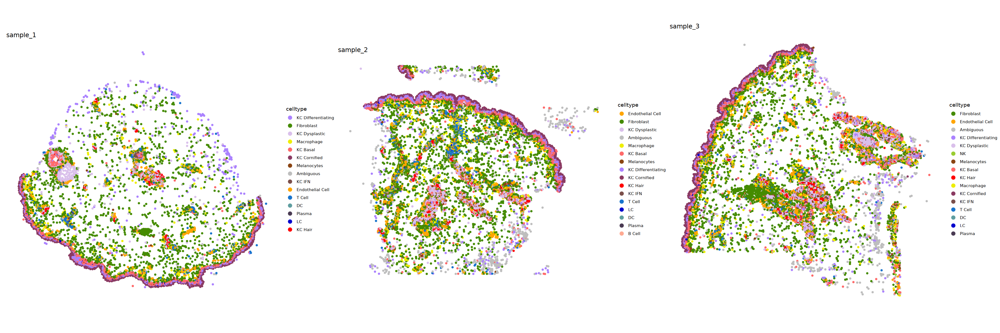

In [44]:
options(repr.plot.width = 30, repr.plot.height = 10)
Reduce("|", plots)

In [88]:
cropped.coords <- Crop(xenium[[2]][["fov"]], y = c(2300, 2800), x = c(1200, 1800), coords = "plot")
xenium[[2]][["zoom"]] <- cropped.coords
# visualize cropped area with cell segmentations & selected molecules
DefaultBoundary(xenium[[2]][["zoom"]]) <- "segmentation"

Warning message:
“Key ‘Xenium_’ taken, using ‘zoom_’ instead”
Warning message:
“Adding image with unordered cells”


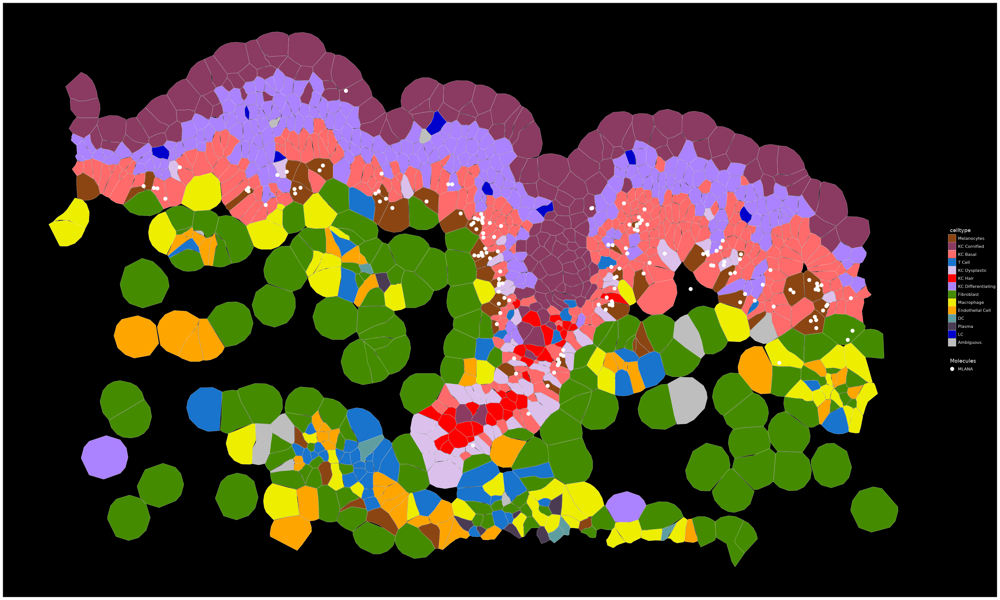

In [110]:
options(repr.plot.width = 30, repr.plot.height = 18)

p <- ImageDimPlot(xenium[[2]], group.by = "celltype", fov = "zoom", axes = F, border.color = "white", border.size = 0.1, cols = level2_color_dict, molecules = "MLANA", mols.size = 3, mols.cols = "white", coord.fixed = F)
p
ggsave(p, filename = paste0(OUPTU_DIR, "Normal_Xenium_sample2_zoom.pdf"), height = 18, width = 30)

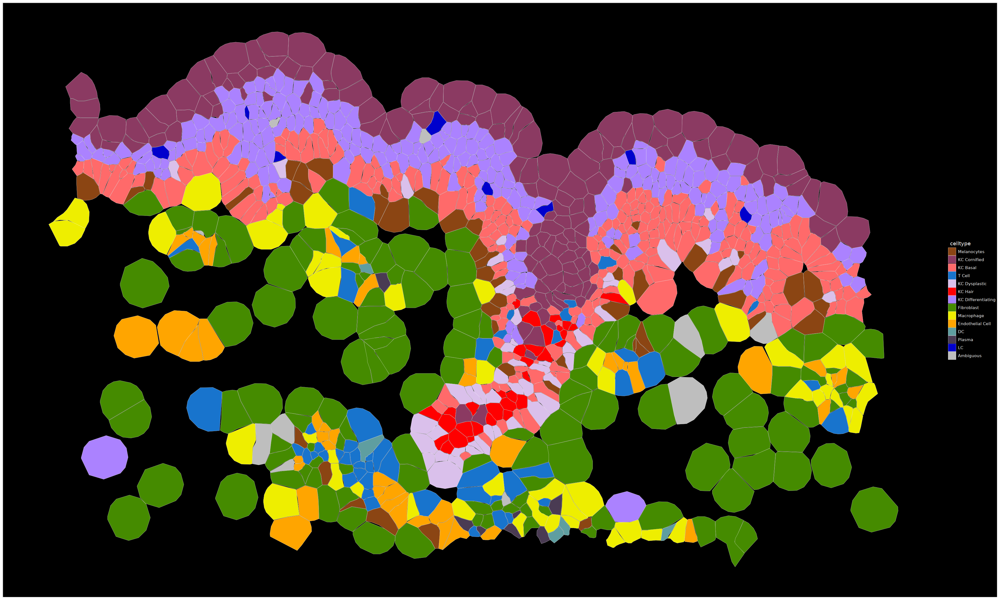

In [116]:
options(repr.plot.width = 30, repr.plot.height = 18)

p <- ImageDimPlot(xenium[[2]], group.by = "celltype", fov = "zoom", axes = F, border.color = "white", border.size = 0.1, cols = level2_color_dict, molecules = "S100B", mols.size = 3, mols.cols = "white", coord.fixed = F)
p

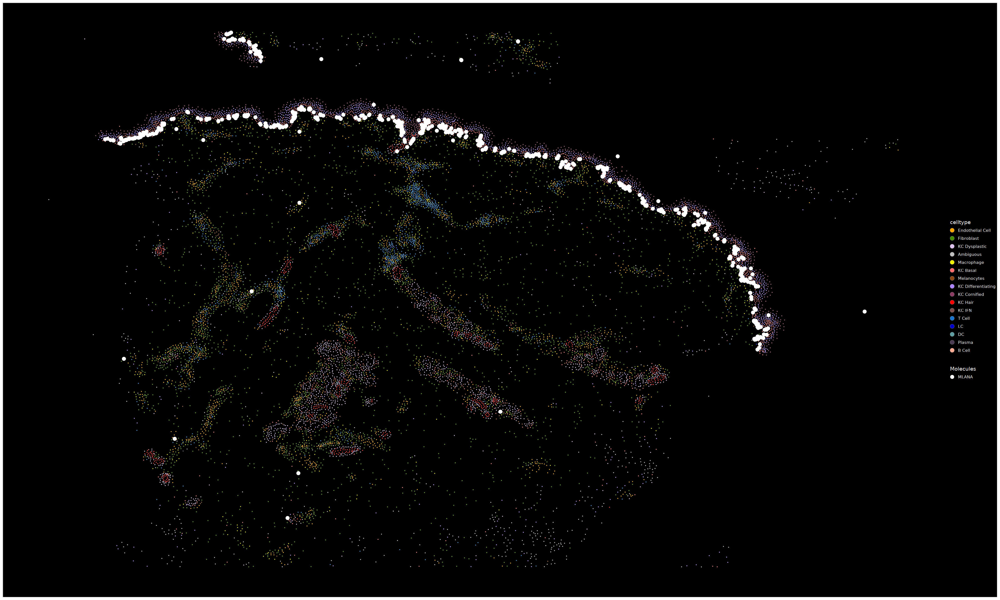

In [122]:
options(repr.plot.width = 30, repr.plot.height = 18)

p <- ImageDimPlot(xenium[[2]], group.by = "celltype", fov = "fov", axes = F, border.color = "white", border.size = 0.1, cols = level2_color_dict, molecules = "MLANA", mols.size = 3, mols.cols = "white", coord.fixed = F)
p

## Session Info

In [35]:
sessionInfo()

R version 4.4.2 (2024-10-31)
Platform: x86_64-conda-linux-gnu
Running under: Rocky Linux 8.10 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /home/uqacause/conda_env/.conda/envs/SkinAtlas/lib/libopenblasp-r0.3.28.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: Australia/Brisbane
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] wrMisc_1.15.2       MuSiC_1.0.0         TOAST_1.20.0       
 [4] quadprog_1.5-8      limma_3.62.1        EpiDISH_2.22.0     
 [7] nnls_1.6            CARD_1.1            Biobase_2.66.0     
[10] Bi